# RDVP-MSD DEMO

### Environment Prepartion
The conda environment named RDVP-MSD needs to be created first following README.md.
Complete the following steps in the shell before opening the jupyter notebook.
```
pip install notebook
pip install ipykernel ipywidgets
python -m ipykernel install --user --name RDVP-MSD
```
Then select the 'RDVP-MSD' kernel in the running notebook.


In [1]:
import logging
import torch
import cv2
import numpy as np
from PIL import Image
import argparse
import yaml
import os

from utils_model import get_text_from_img, get_mask, fuse_mask, DotDict
from utils_model import printd, mkdir

In [2]:
parser = argparse.ArgumentParser()
parser.add_argument('--config', default='config/COD10K_LLaVA1.5.yaml')
# parser.add_argument('--visualization', default='False')
parser.add_argument('--save_path', default='./res/prediction_RDVP_MSD/')
args, unknown = parser.parse_known_args()

## save dir
config_name = args.config.split("/")[-1][:-5]
save_path_pred_dir = f'{args.save_path}/{config_name}/'
mkdir(save_path_pred_dir)
visualize_save_path = f'{args.save_path}/visualize/{config_name}/'
mkdir(visualize_save_path)

In [3]:
# logging
logging.basicConfig(filename=args.save_path + 'log.log',
                    format='[%(asctime)s-%(filename)s-%(levelname)s:%(message)s]',
                    level=logging.INFO, filemode='a', datefmt='%Y-%m-%d %I:%M:%S %p')

device = "cuda" if torch.cuda.is_available() else "cpu"

with open(args.config, 'r') as f:
    config = yaml.load(f, Loader=yaml.FullLoader)

filenames = sorted(os.listdir(config['test_dataset']['root_path_images']))
data_len = len(filenames)
printd(f"dataset size:\t {len(filenames)}")

2025-08-15 22:54:32	 dataset size:	 2026


In [4]:
## load pretrained model  
# CLIP surgery, SAM, LLaVA/BLIP
from segment_anything_hq import sam_model_registry, SamPredictor
import clip
sam = sam_model_registry[config['sam_model_type']](checkpoint=config['sam_checkpoint'])
sam.to(device=device)
sam_predictor = SamPredictor(sam)
clip_params={ 'attn_qkv_strategy':config['clip_attn_qkv_strategy']}
clip_model, _ = clip.load(config['clip_model'], device=device, params=clip_params)
clip_model.eval()
llm_dict=None
if config['llm']=='blip':
    from lavis.models import load_model_and_preprocess
    # blip_model_type="pretrain_opt2.7b"
    blip_model_type="pretrain_opt6.7b"
    printd(f'loading BLIP ({blip_model_type})...')
    BLIP_model, BLIP_vis_processors, _ = load_model_and_preprocess(name="blip2_opt",
                                                                   model_type=blip_model_type,
                                                                   is_eval=True,
                                                                   device=device)
    BLIP_dict = {"demo_data/9.jpg": 'lizard in the middle',}
    llm_dict = {
        'model': BLIP_model,
        'vis_processors':  BLIP_vis_processors,
    }
elif config['llm']=='LLaVA' or config['llm']=='LLaVA1.5':
    from llava.model.builder import load_pretrained_model
    from llava.utils import disable_torch_init
    from llava.mm_utils import get_model_name_from_path
    disable_torch_init()
    if config['llm']=='LLaVA':
        model_path = 'liuhaotian/llava-llama-2-13b-chat-lightning-preview/'
    else:
        model_path = 'liuhaotian/llava-v1.5-13b'
    print(f'llava pretrained model: {model_path}')
    model_path = os.path.expanduser(model_path)
    config['model_name'] = get_model_name_from_path(model_path)
    tokenizer, model, image_processor, context_len = load_pretrained_model(model_path, config['model_base'], config['model_name'])
    if 'llama-2' in config['model_name'].lower(): # from clip.py
        conv_mode = "llava_llama_2"
    elif "v1" in config['model_name'].lower():
        conv_mode = "llava_v1"
    elif "mpt" in config['model_name'].lower():
        conv_mode = "mpt"
    else:
        conv_mode = "llava_v0"
    config['conv_mode'] = conv_mode
    llm_dict = {
        'model': model,
        'vis_processors':  image_processor,
        'tokenizer': tokenizer,
        'conv_mode': config['conv_mode'],
        'temperature': config['temperature'],
        'w_caption': config['LLaVA_w_caption'],
    }
else:
    exit(f'unknow LLM: {config["llm"]}')

/media/store/yc/miniconda3/envs/RDVP-MSD/lib/python3.8/site-packages/segment_anything_hq/build_sam.py:160: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.l

<All keys matched successfully>
[2025-08-15 22:54:53,616] [INFO] [real_accelerator.py:110:get_accelerator] Setting ds_accelerator to cuda (auto detect)
llava pretrained model: liuhaotian/llava-v1.5-13b


/media/store/yc/miniconda3/envs/RDVP-MSD/lib/python3.8/site-packages/deepspeed/runtime/zero/linear.py:49: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  def forward(ctx, input, weight, bias=None):
/media/store/yc/miniconda3/envs/RDVP-MSD/lib/python3.8/site-packages/deepspeed/runtime/zero/linear.py:67: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  def backward(ctx, grad_output):
/media/store/yc/miniconda3/envs/RDVP-MSD/lib/python3.8/site-packages/huggingface_hub/file_download.py:945: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

/media/store/yc/miniconda3/envs/RDVP-MSD/lib/python3.8/site-packages/transformers/modeling_utils.py:460: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(chec

In [5]:
for s_i, img_name in zip(range(data_len), filenames):
    img_path = config['test_dataset']['root_path_images'] + img_name
    printd(img_path)
    logging.info(img_path)

2025-08-15 22:55:14	 ../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-1-BatFish-2.jpg
2025-08-15 22:55:14	 ../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-1-BatFish-4.jpg
2025-08-15 22:55:14	 ../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-1-BatFish-5.jpg
2025-08-15 22:55:14	 ../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-1-BatFish-6.jpg
2025-08-15 22:55:14	 ../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-10-LeafySeaDragon-416.jpg
2025-08-15 22:55:14	 ../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-10-LeafySeaDragon-419.jpg
2025-08-15 22:55:14	 ../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-10-LeafySeaDragon-422.jpg
2025-08-15 22:55:14	 ../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-10-LeafySeaDragon-423.jpg
2025-08-15 22:55:14	 ../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-10-LeafySeaDragon-429.jpg
2025-08-15 22:55:14	 ../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-11-Octopus-430.jpg
2025-08

In [6]:
img_path = '../Dataset/TestDataset/COD10K/Image/COD10K-CAM-1-Aquatic-6-Fish-174.jpg'

pil_img = Image.open(img_path).convert("RGB")

## infer RDVP-MSD
textfg_phrase_list, textbg_phrase_list,textfg_word_list, textbg_word_list,bbox_ori_list = get_text_from_img(pil_img, config['prompt_q'], llm_dict,
                                  config['use_gene_prompt'], config['clip_use_bg_text'], DotDict(config))
print(f'iter 0 text:\t{textfg_phrase_list}, {textbg_phrase_list}')
logging.info(f'iter 0 text:\t{textfg_phrase_list}, {textbg_phrase_list}')
print(f'iter 0 text:\t{textfg_word_list}, {textbg_word_list}')
logging.info(f'iter 0 text:\t{textfg_word_list}, {textbg_word_list}')
print(f'iter 0 text:\t{bbox_ori_list}')
logging.info(f'iter 0 text:\t{bbox_ori_list}')

A camouflaged object is a fish with a red eye and a white body.
A camouflaged fish with a red eye and a white body.
a rock with a red and white fish on it.
Fish
Rock
[0.1, 0.37, 0.61, 0.76]
A camouflaged animal is sitting on a rock in the ocean.
A camouflaged animal with a spotted pattern and a long tail.
a rocky surface with a spotted pattern and a long tail.
Fish
Ocean
[0.22, 0.41, 0.61, 0.72]
A camouflaged entity is hiding in the image, blending in with the surrounding environment.
A camouflaged entity with a spiky texture and a dark color.
a rocky environment with a spiky texture and a dark color.
Crab
Rock
[0.24, 0.4, 0.64, 0.76]
iter 0 text:	['a camouflaged fish with a red eye and a white body', 'a camouflaged animal with a spotted pattern and a long tail', 'a camouflaged entity with a spiky texture and a dark color'], ['a rock with a red and white fish on it', 'a rocky surface with a spotted pattern and a long tail', 'a rocky environment with a spiky texture and a dark color']
i

In [7]:
%matplotlib inline
from tools import plot_image_with_bboxes_and_points

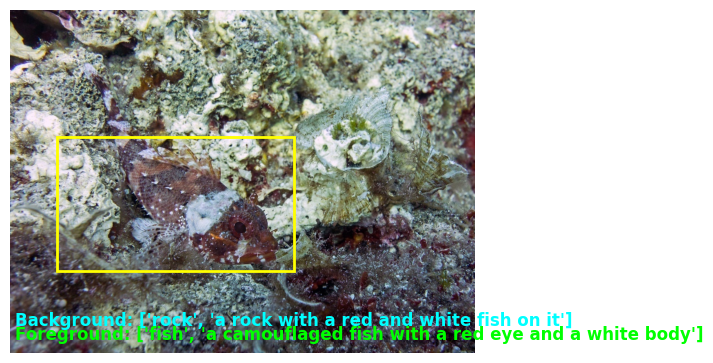

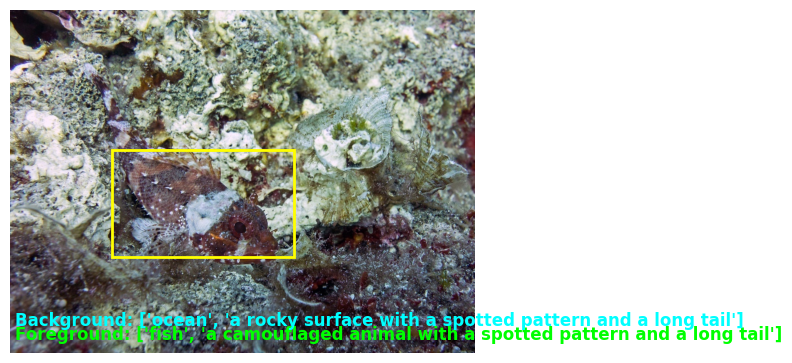

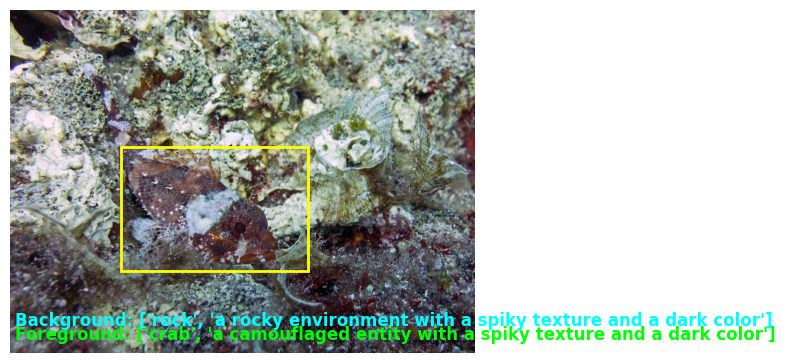

In [8]:
for i in range(len(bbox_ori_list)):
    plot_image_with_bboxes_and_points(
        cur_image=np.array(pil_img),
        bbox=bbox_ori_list[i],
        points=None,
        labels=None,
        word_fg=[textfg_word_list[i], textfg_phrase_list[i]],
        word_bg=[textbg_word_list[i], textbg_phrase_list[i]],
        mask=None,
        save_path=None,
        show=True
    )

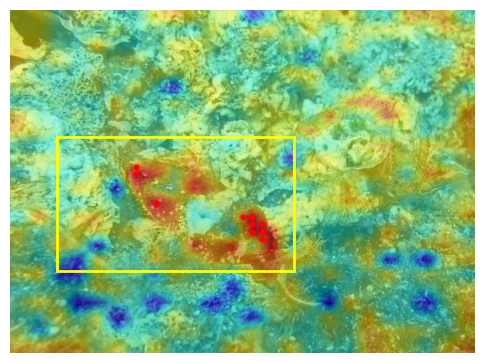

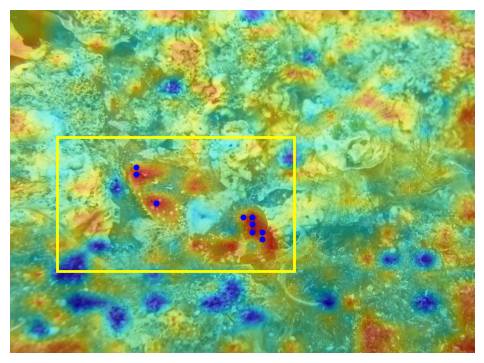

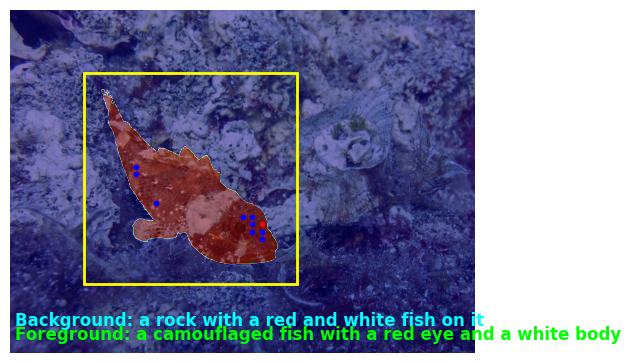

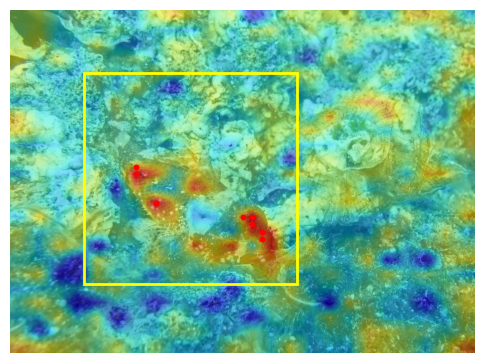

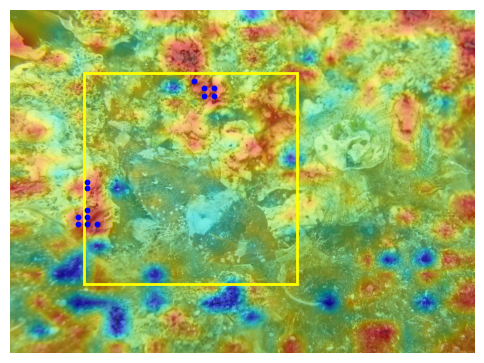

...

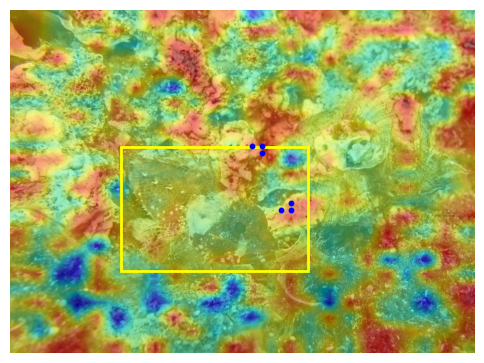

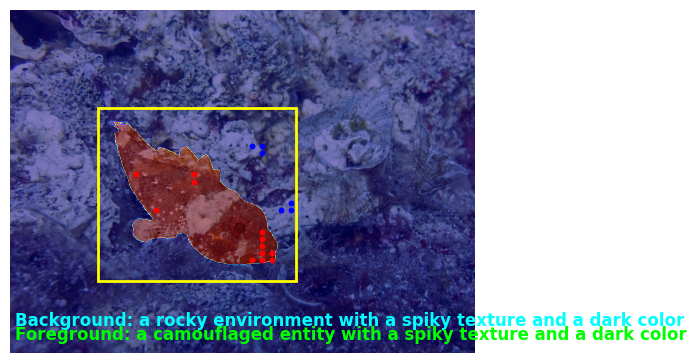

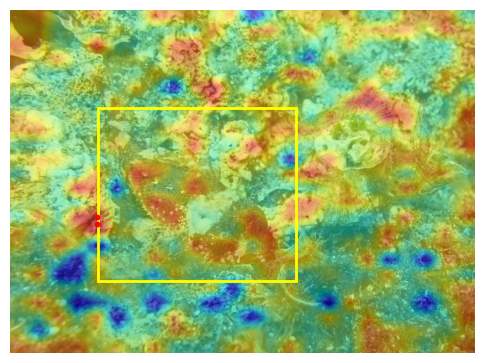

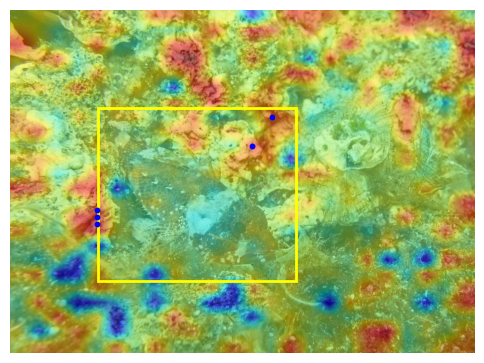

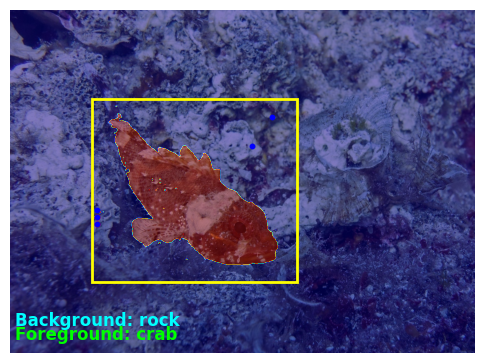

In [9]:
mask_l, mask_logit_origin_l = get_mask(pil_img,
                                           textfg_phrase_list,
                                           textfg_word_list,
                                           sam_predictor,
                                           clip_model,
                                           DotDict(config),
                                           logging,
                                           visualize_save_path,
                                           img_path,
                                           llm_dict=llm_dict,
                                           textbg_phrase_list=textbg_phrase_list,
                                           textbg_word_list=textbg_word_list,
                                           bbox_ori_list=bbox_ori_list,)

In [10]:
vis_mask_acc, vis_mask_logit_acc = fuse_mask(mask_logit_origin_l,
                                                 sam_predictor.model.mask_threshold) # fuse masks

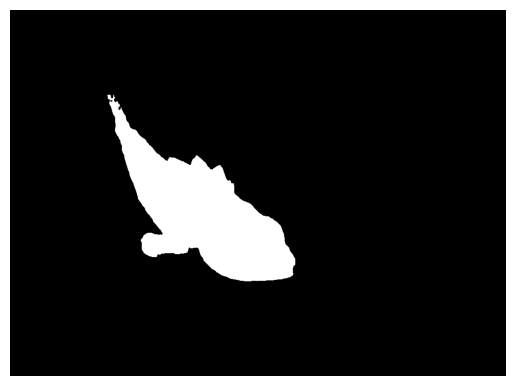

In [11]:
import matplotlib.pyplot as plt
# get metric of mask closest to fused mask
mask_delta_l = [np.sum((mask_i - vis_mask_acc)**2) for mask_i in mask_l]  # distance of each mask to fused one
idxMaskSim = np.argmin(mask_delta_l)
vis_tensor = mask_l[idxMaskSim].astype('uint8') * 255

plt.imshow(vis_tensor, cmap='gray')
plt.axis('off')
plt.show()